In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings; warnings.filterwarnings('ignore')
from fastai.vision import *
sys.path.append("dev/")
path = Path('/data/users/turgutluk/histopathologic/')

In [3]:
torch.cuda.set_device(3)

In [4]:
df = pd.read_csv(path/'train_labels.csv')

In [5]:
wsi_ids = pd.read_csv(path/'patch_id_wsi.csv')
wsi_ids.head()

,id,wsi
0,f38a6374c348f90b587e046aac6079959adf3835,camelyon16_train_normal_033
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,camelyon16_train_tumor_054
2,755db6279dae599ebb4d39a9123cce439965282d,camelyon16_train_tumor_008
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,camelyon16_train_tumor_077
4,acfe80838488fae3c89bd21ade75be5c34e66be7,camelyon16_train_tumor_036


In [6]:
df = pd.merge(df,wsi_ids,on='id',how='left')

In [7]:
print(f"missing WSI: {np.round(df.wsi.isna().sum()/len(df), 3)}"); df.head()

missing WSI: 0.124


,id,label,wsi
0,f38a6374c348f90b587e046aac6079959adf3835,0,camelyon16_train_normal_033
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1,camelyon16_train_tumor_054
2,755db6279dae599ebb4d39a9123cce439965282d,0,camelyon16_train_tumor_008
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0,camelyon16_train_tumor_077
4,068aba587a4950175d04c680d38943fd488d6a9d,0,NaN


In [8]:
# # same patches will not be in both train and val
# unique_ids = np.unique(df.wsi.dropna()); len(unique_ids)
# np.random.seed(42)
# nfolds = 5
# fold_ids = np.array_split(np.random.permutation(unique_ids), nfolds); len(fold_ids)
# cv_idxs = []

# for i in range(len(fold_ids)):
#     cv_idxs.append((np.where(df['wsi'].isin(fold_ids[i]))[0],
#     np.where(~df['wsi'].isin(fold_ids[i]))[0]))
    
# for i in range(len(fold_ids)):
#     print(len(cv_idxs[i][0]), len(cv_idxs[i][1]))

**Create validation folds which doesn't (almost) have overlapping WSI Ids.**

In [9]:
# tfms = get_transforms(True, True, max_rotate=30, max_zoom=0, max_lighting=0.3,
#                       max_warp=0, p_affine=0.5, p_lighting=0.5, xtra_tfms=[])

# def get_data(trn_idx, val_idx, tfms=tfms):
#     data = (ImageList.from_df(df=df, path=path, folder='train', suffix='.tif')
#         .split_by_idx(valid_idx=val_idx)
#         .label_from_lists(train_labels=list(df['label'].iloc[trn_idx].values),
#                                         valid_labels=list(df['label'].iloc[val_idx].values))
#         .transform(tfms, size=224)
#         .databunch(bs=256, num_workers=16)
#         .normalize(imagenet_stats))
#     data.add_test(ImageList.from_folder(path/'test'))
#     return data

# data_version='_sz_224'
# cv_idxs = pd.read_pickle(path/'models/cv_non_overlap_idxs.pkl')
# cv_data = [get_data(idxs[1], idxs[0]) for idxs in cv_idxs]
# pd.to_pickle(cv_data, path/f'models/cv_data_{data_version}.pkl')

### check data

In [9]:
fold_data = cv_data[0]

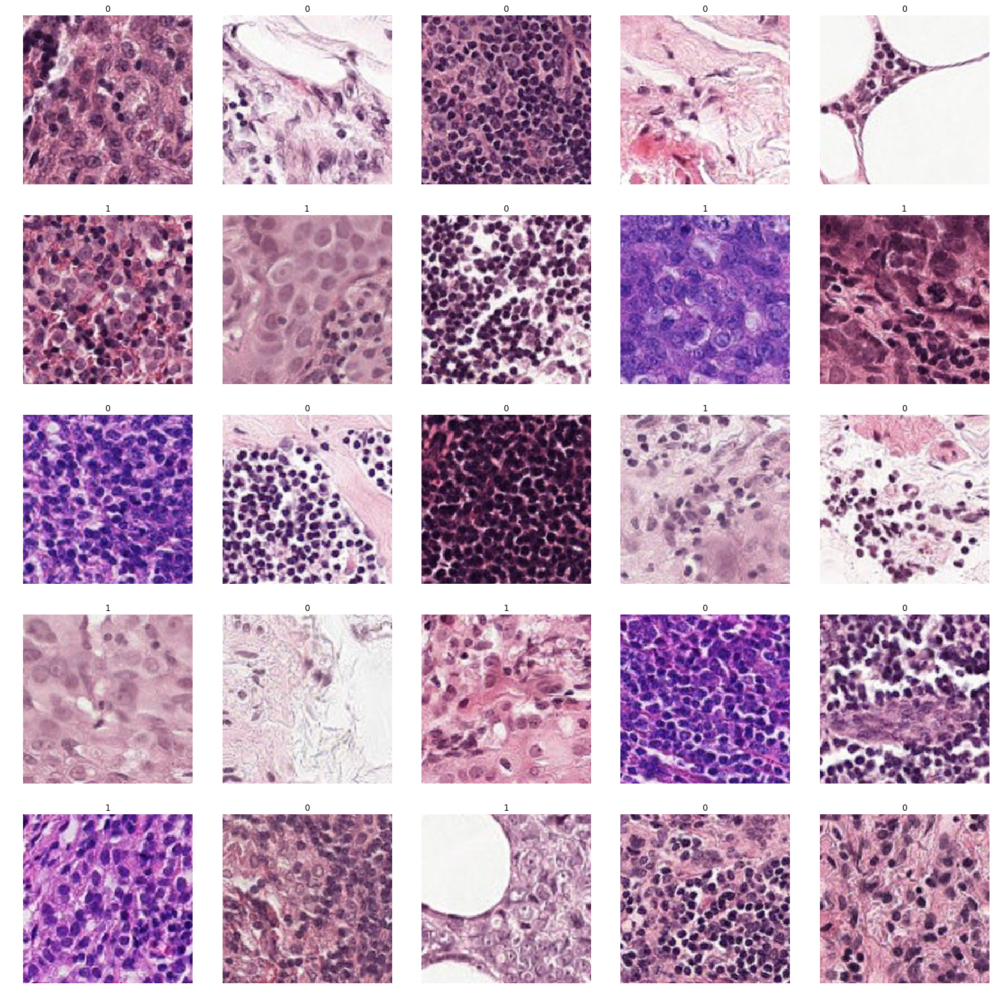

In [10]:
fold_data.show_batch()

### check augmentations

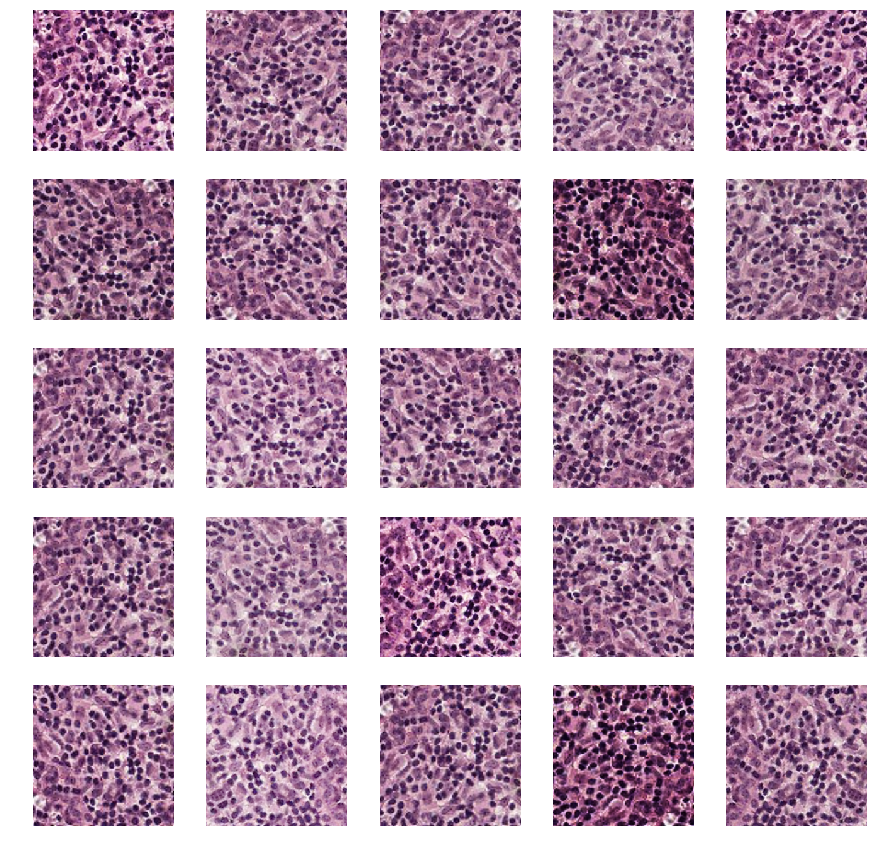

In [11]:
i = np.random.choice(np.arange(len(fold_data.train_ds)))
r,c=5,5
fig, axes = plt.subplots(r,c,figsize=(r*3,c*3))
for ax in axes.flatten(): fold_data.train_ds[i][0].show(ax=ax)

In [23]:
xb,yb=cv_data[0].one_batch()

In [25]:
xb.device

device(type='cpu')

### Additional Augmentations - torchvision.transforms

In [12]:
import torchvision.transforms as torch_tfms

In [13]:
def image2pil(img):
    "fastai Image to PIL image"
    return PIL.Image.fromarray((image2np(img.data)*255).astype(np.uint8))

def pil2image(pil_img):
    "PIL Image to fastai Image"
    return Image(pil2tensor(pil_img, np.float32).div_(255))

In [16]:
i = np.random.choice(np.arange(len(fold_data.valid_ds)))
img = fold_data.valid_ds[i][0]

In [33]:
Image(pil2image(image2pil(img)).data.cuda()).data

tensor([[[0.5529, 0.4431, 0.3373,  ..., 0.4118, 0.3333, 0.2588],
         [0.5725, 0.5216, 0.4706,  ..., 0.4588, 0.4471, 0.4353],
         [0.5961, 0.6000, 0.6000,  ..., 0.5059, 0.5569, 0.6118],
         ...,
         [0.4157, 0.4745, 0.5333,  ..., 0.2627, 0.3490, 0.4392],
         [0.5216, 0.5098, 0.5020,  ..., 0.2706, 0.3137, 0.3608],
         [0.6275, 0.5490, 0.4706,  ..., 0.2824, 0.2824, 0.2824]],

        [[0.3569, 0.2549, 0.1529,  ..., 0.2235, 0.1569, 0.0902],
         [0.3961, 0.3451, 0.2980,  ..., 0.2667, 0.2588, 0.2549],
         [0.4392, 0.4392, 0.4431,  ..., 0.3098, 0.3647, 0.4196],
         ...,
         [0.1843, 0.2588, 0.3333,  ..., 0.1255, 0.2157, 0.3098],
         [0.2980, 0.3020, 0.3098,  ..., 0.1412, 0.1922, 0.2392],
         [0.4118, 0.3490, 0.2863,  ..., 0.1569, 0.1647, 0.1725]],

        [[0.7294, 0.6275, 0.5255,  ..., 0.6314, 0.5373, 0.4431],
         [0.7647, 0.7176, 0.6667,  ..., 0.6706, 0.6353, 0.6039],
         [0.8039, 0.8078, 0.8078,  ..., 0.7059, 0.7373, 0.

<class 'fastai.vision.image.Image'>


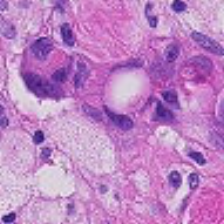

In [364]:
print(type(img)); img

<class 'PIL.Image.Image'>


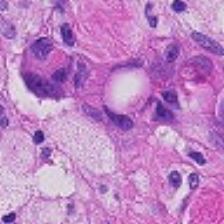

In [365]:
pil_img = image2pil(img.data);print(type(pil_img));pil_img

In [29]:
composed_transform = torch_tfms.Compose([
    torch_tfms.RandomChoice([
        torch_tfms.ColorJitter(brightness=0.5),
        torch_tfms.ColorJitter(contrast=0.5), 
        torch_tfms.ColorJitter(saturation=0.5),
        torch_tfms.ColorJitter(hue=0.5),
        torch_tfms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1), 
        torch_tfms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.3), 
        torch_tfms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5), 
    ]),
    torch_tfms.RandomGrayscale(p=.3)
])

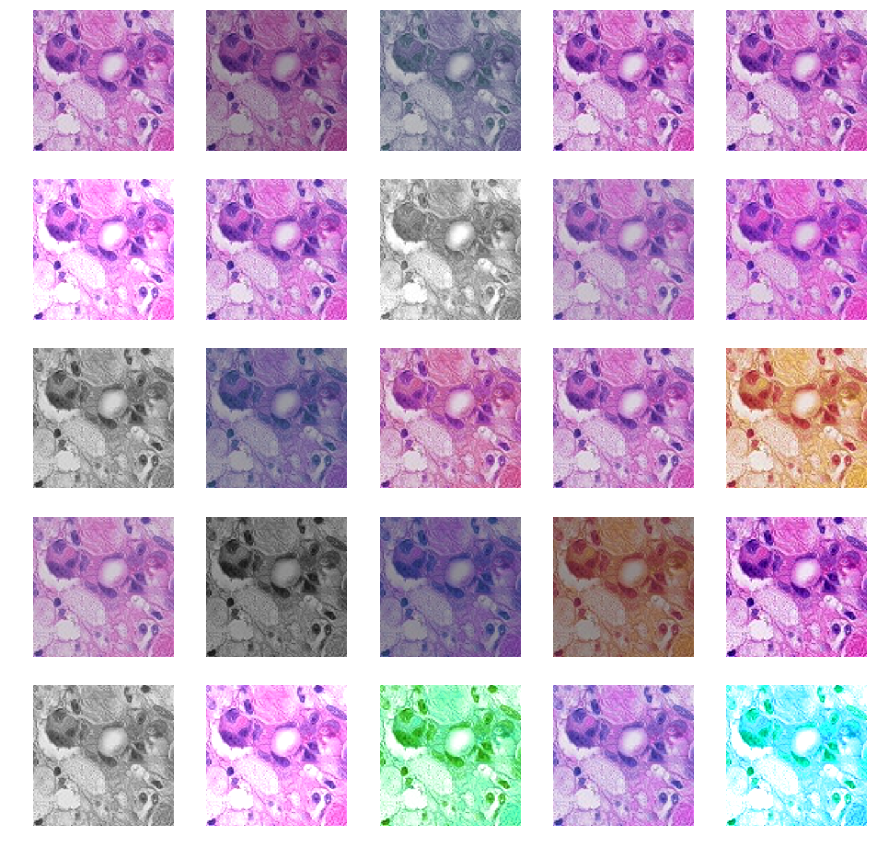

In [367]:
r,c=5,5
fig, axes = plt.subplots(r,c,figsize=(r*3,c*3))
for ax in axes.flatten(): pil2image(composed_transform(pil_img)).show(ax=ax)

In [368]:
def _torchvision_composed(x, composed_tfms):
    "x: tensor, composed_tfms: a torchvision.transforms.Composed object"
    return pil2image(composed_tfms(image2pil(Image(x)))).data
torchvision_composed = TfmPixel(_torchvision_composed)
composed_tfms = torchvision_composed(composed_tfms=composed_transform, p=1.)

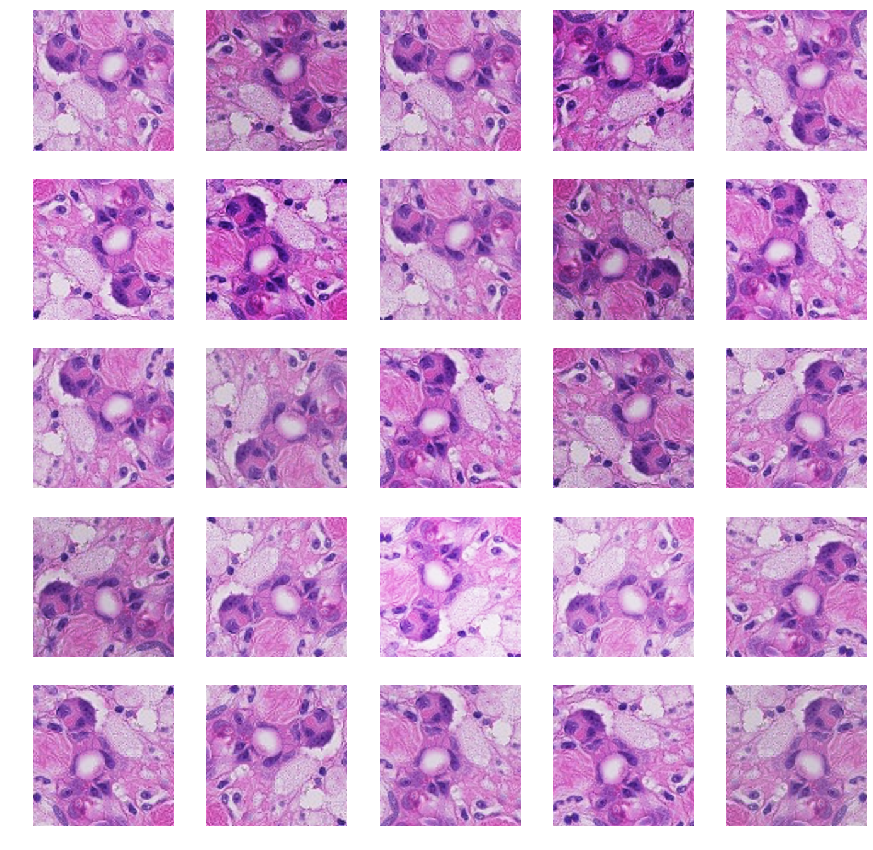

In [369]:
r,c=5,5
fig, axes = plt.subplots(r,c,figsize=(r*3,c*3))
for ax in axes.flatten(): img.apply_tfms(tfms=fold_data.train_dl.dl.tfms).show(ax=ax)

### new data

In [10]:
from transform_utils import *

composed_transform = torch_tfms.Compose([
    torch_tfms.RandomChoice([
        torch_tfms.ColorJitter(brightness=0.5),
        torch_tfms.ColorJitter(contrast=0.5), 
        torch_tfms.ColorJitter(saturation=0.5),
        torch_tfms.ColorJitter(hue=0.5),
        torch_tfms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1), 
        torch_tfms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.3), 
        torch_tfms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5), 
    ]),
    torch_tfms.RandomGrayscale(p=.3)
])

In [11]:
composed_tfms = torchvision_composed(composed_tfms=composed_transform, p=0.5)

tfms = get_transforms(True, True, max_rotate=30, max_zoom=0, max_lighting=0.3,
                      max_warp=0, p_affine=0.5, p_lighting=0.5) 

tfms[0].append(composed_tfms)

In [12]:
def get_data(trn_idx, val_idx, tfms=tfms):
    data = (ImageList.from_df(df=df, path=path, folder='train', suffix='.tif')
        .split_by_idx(valid_idx=val_idx)
        .label_from_lists(train_labels=list(df['label'].iloc[trn_idx].values),
                                        valid_labels=list(df['label'].iloc[val_idx].values))
        .transform(tfms, size=192)
        .databunch(bs=64, num_workers=40)
        .normalize(imagenet_stats))
    data.add_test(ImageList.from_folder(path/'test'))
    return data

data_version='sz_192'
cv_idxs = pd.read_pickle(path/'models/cv_non_overlap_idxs.pkl')
cv_data = [get_data(idxs[1], idxs[0]) for idxs in cv_idxs]
pd.to_pickle(cv_data, path/f'models/cv_data_{data_version}.pkl')

In [12]:
path/f'models/cv_data_{data_version}.pkl'

PosixPath('/data/users/turgutluk/histopathologic/models/cv_data_sz_192.pkl')

In [13]:
fold_data = cv_data[0]

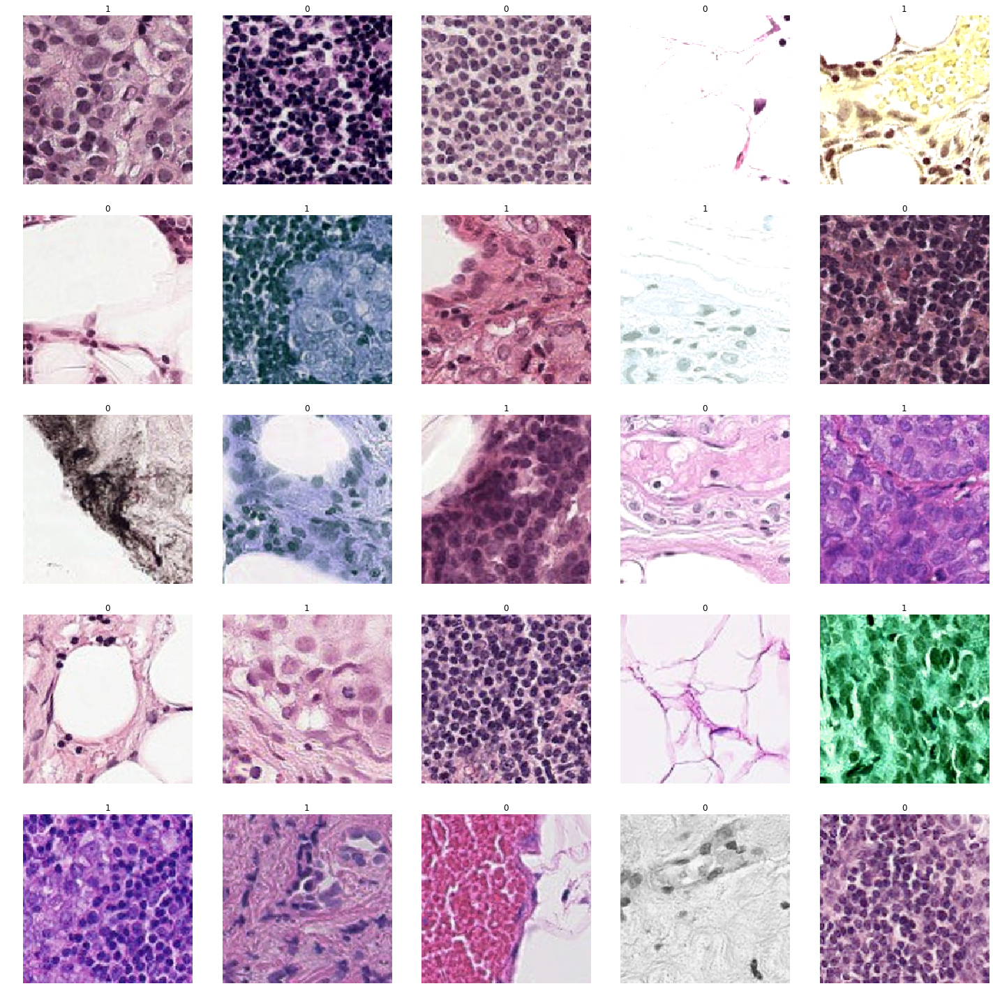

In [14]:
fold_data.show_batch()

### check training

In [13]:
from fastai.callbacks import *
from metric_utils import AUC

In [14]:
cv_data = pd.read_pickle(path/f'models/cv_data_{data_version}.pkl')
arch = models.densenet201
model_name = arch.__name__ 
model_suffix = "_224_more_aug"
print(f"Starting Training with model: {model_name}")

Starting Training with model: densenet201


In [15]:
MODEL_NAME = f"{model_name}{model_suffix}"; MODEL_NAME

'densenet201_224_more_aug'

In [16]:
# define callbacks
i = 0 
fold_num = i
fold_data = cv_data[i]

# create saved model dir
os.makedirs(path/f'models/best_of_{MODEL_NAME}', exist_ok=True)

# Initialize Learner
print(f"Initialize Learner at fold{fold_num}")
auc = AUC()
learn_callbacks = [TerminateOnNaNCallback()]
learn_callback_fns = [partial(EarlyStoppingCallback, monitor='auc', mode='max', patience=3),
                      
                      partial(SaveModelCallback, monitor='auc', mode='max', every='improvement',
                              name=f'best_of_{MODEL_NAME}/fold{fold_num}'),
                      
                      partial(ReduceLROnPlateauCallback, monitor='auc', mode='max', patience=0, factor=0.9),
                      
                      partial(CSVLogger, filename=f'logs/{MODEL_NAME}', append=True)]

Initialize Learner at fold0


In [17]:
learn = cnn_learner(data=fold_data, base_arch=arch, metrics=[accuracy, auc], 
                    lin_ftrs=[1024,1024], ps=[0.7, 0.7, 0.7],
                    callbacks=learn_callbacks,
                    callback_fns=learn_callback_fns)

In [18]:
# Stage-1 training
print("Stage-1")
learn.lr_find()

Stage-1


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


IndexError: list index out of range

In [ ]:
learn.recorder.metrics

In [ ]:
try:
    learn.recorder.plot(suggestion=True, k=5)
except: 
     learn.recorder.plot(suggestion=True)
max_lr = learn.recorder.min_grad_lr

In [ ]:
print(f"Stage-1 training with lr={max_lr}")
learn.fit_one_cycle(50, max_lr=max_lr, wd=1e-4)

In [ ]:
# Stage-2 training
print("Stage-2")
learn.freeze_to(1)
learn.lr_find()
try:
    learn.recorder.plot(suggestion=True, k=5)
except: 
     learn.recorder.plot(suggestion=True)
max_lr = learn.recorder.min_grad_lr
print(f"Stage-2 training with lr={max_lr}")
learn.fit_one_cycle(20, max_lr=[max_lr/10, max_lr/3, max_lr])

In [ ]:
# Stage-3 training
print("Stage-3")
learn.unfreeze()
learn.lr_find()
try:
    learn.recorder.plot(suggestion=True, k=5)
except: 
     learn.recorder.plot(suggestion=True)
max_lr = learn.recorder.min_grad_lr
print(f"Stage-3 training with lr={max_lr}")
learn.fit_one_cycle(5, max_lr=[max_lr/10, max_lr/3, max_lr])

In [ ]:
print(f"Training of fold{fold_num} model is done...destroying learner")
learn.destroy()